# Analysis of popular attractions in Glasgow based on Tripadvisor data

#### 2519347w
#### 04.04.2021

## 1.Introduction

Tourism is one of Scotland's most important industries, providing Scotland with 5% of GDP and 8.5% of the employed population (Scottish Government, 2020). In 2017, Glasgow City Council took the lead in launching Glasgow's Tourism and Visitor Plan. The plan aims to bring 771 million pounds of economic growth to Glasgow and create 6,600 new jobs. (Glasgow City Council, 2017) 

As early as 2008, studies have found that online comments have a significant influence on tourists' choices. (Gretzel and Yoo, 2008) Therefore, studying the content of online comments of essential attractions in Glasgow is very useful to Glasgow's tourism industry.

TripAdvisor is currently the world's largest Internet travel review platform. As of 2020, the total number of users' comments on TripAdvisor has reached 884 million. According to its statistics, 72% of website visitors often refer to relevant comments when deciding where to travel, accommodation, and restaurants. (TripAdvisor, 2019)
Therefore, the images of Glasgow attractions on TripAdvisor will affect many potential tourists' decisions. The massive comments left by tourists can also help us understand the crucial features of Glasgow attractions. These will be the basis for policy maker to formulate policies to promote the development of Glasgow tourism.

In summary, this research attempts to answer the following three questions:
1. **What are the Top100 attractions in Glasgow on TripAdvisor? Where they are, how popular they are and how they are rated by visitors?**
2. TripAdvisor has put forward the concept of Top15 in each city because most tourists from other cities and countries will only choose their destination from the Top15. So, **what are the Top15 attractions in Glasgow? What kind of tourists do these attractions attract? What comments did the tourists leave? How have these comments changed over time?**
3. Due to the openness and profitability requirements of TripAdvisor, the ranking and comment data of attractions are inevitably be mixed with varying degrees of noise. Therefore, this research also tries to **explore which attractions have too much noise in their comments that makes them rank higher than they really are.**


## 2.Data

### 2.1 Data collection
The data used in this research is divided into two parts. The first part is the basic information of Glasgow Top100 attractions. The second part is details of Glasgow Top15 attractions' visitors and their comments. Because TripAdvisor strictly controls its API, these two parts are collected through data scraping.

It is worth noting that when visitors search for the keyword 'Glasgow' in TripAdvisor, some of the attractions close to Glasgow City Council boundaries also appear in the same interface, so this research does not make a strict distinction between the study boundaries in terms of administrative areas, but rather the actual search results from TripAdvisor.

The first part is collected by parsing the website code through the 'BeautifulSoup' package and 'Nominatim' service in python. For brevity, the code of scraping is stored in the attachment. For details, see **Appendix1 Top100data.ipynb** or **Appendix1 Top100data.html**. This part includes the name, rating, comment volume, cover image and geographic coordinates of Glasgow top100 attractions. 

Because TripAdvisor has a dynamic loading mechanism. All long comments need to click to load, and its anti-crawler mechanism will also block IP with high request frequency. Therefore, this part of the data is scraped using 'Webharvy' to imitate manual clicks. Fifteen XML files containing scraping rules are placed in the appendix, open **Appendix2 Webhary XML.rar** for details.



### 2.2 Data cleaning
The data of Top100 was cleaned when it was scrapped, and it is stored as a 'top100.csv' file. 

The raw data of Top15 captured by 'Webharvy' has 15 separate CSV files. For the sake of brevity, the process is also stored as a separate file. **Appendix3 Top15data.ipynb** and **Appendix3 Top15data.html** shows the cleaning process of the raw data of one attraction, and the other 14 raw data have the same processing flow. Finally, these 15 clean data are merged into the top15.csv file.

In some rare cases, the 'date of experience' is missing. Because the comments in TripAdvisor are sorted by time except for the homepage, and the time is only accurate to the month. Therefore, the 'date' is very close to or equal to the adjacent previous or next value. So, in this research, filled the missing 'date' with adjacent values from front to back.

## 3. Top100 attractions data analysis

In [1]:
import pandas as pd
import numpy as np
import os
import string

In [2]:
import matplotlib.pyplot as plt
import seaborn as sns
from plotnine import *
%matplotlib inline
import matplotlib.image as mpimg

In [3]:
import folium
from folium import plugins
import branca 
import branca.colormap as cm

### 3.1 cover image of Top100
The 100 small images in the following figure show the cover image of Glasgow's top 100 destinations on TripAdvisor. For those who do not know Glasgow, the cover image's quality will profoundly affect their first impression. Some of them show clear and attractive images. In comparison, some will make people feel confusing. For example, in the second picture, the Riverside Museum's main building does not appear. Instead, it appears as the background in the 19th small image. 

The relevant attractions staff should contact the staff of TripAdvisor and provide high-quality photographic pictures to provide potential visitors with a clear and good first impression.



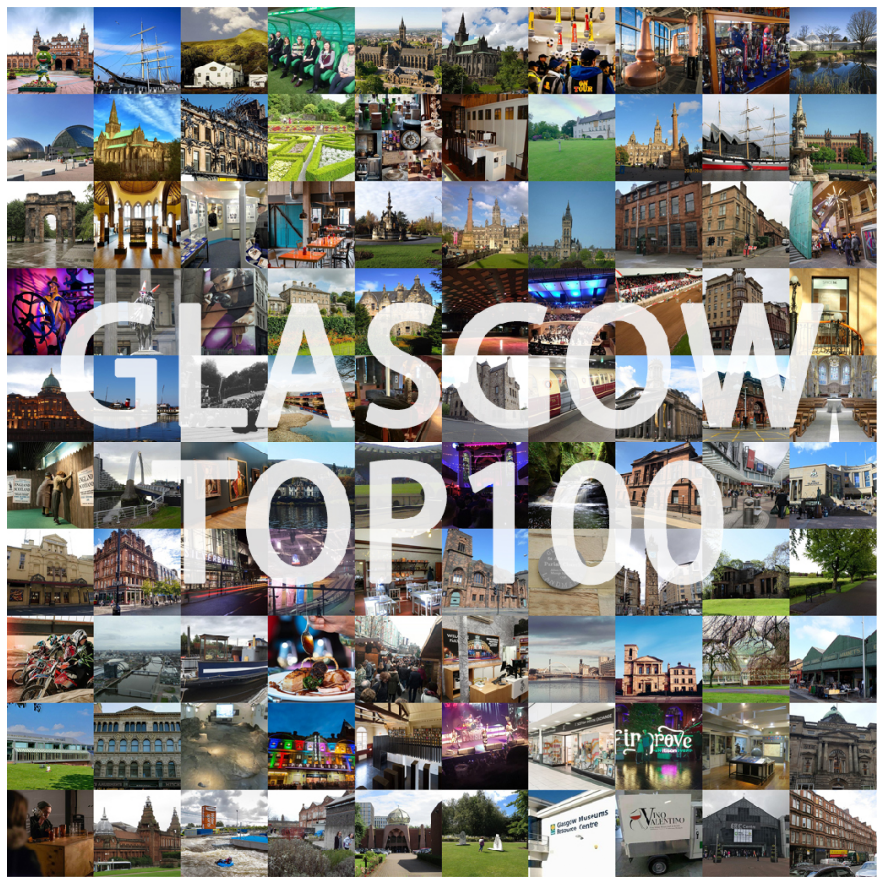

In [4]:
plt.figure(figsize=(16,16))
lena = mpimg.imread('top100.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

In [5]:
top100 = pd.read_csv('top100.csv')

In [6]:
top100.head()

,number,name,image_link,score,review_volunme,detail,lat,lon
0,1,Kelvingrove Art Gallery and Museum,https://dynamic-media-cdn.tripadvisor.com/medi...,4.5,15299,Art Museums,55.868582,-4.290628
1,2,The Riverside Museum of Transport and Travel,https://dynamic-media-cdn.tripadvisor.com/medi...,4.5,9436,Speciality Museums,55.865175,-4.306249
2,3,Glengoyne Distillery,https://dynamic-media-cdn.tripadvisor.com/medi...,4.5,1562,Distilleries,56.014053,-4.363973
3,4,Celtic Park,https://dynamic-media-cdn.tripadvisor.com/medi...,4.5,1550,Arenas & Stadiums,55.849758,-4.205469
4,5,University of Glasgow,https://dynamic-media-cdn.tripadvisor.com/medi...,4.5,1995,Educational sites,55.872315,-4.289219


### 3.2 The distribution of Top100 attractions
It can be seen from the map that most of Glasgow Top 100 attractions are in the city centre and west end areas. The two areas are closely connected geographically. Therefore, the arrangement of tourist signs and public transportation facilities can encourage visitors to visit more attractions in a day and stimulate more consumption.
Drag and zoom the map to see the specific location and gathering situation of the Top100. Click on the mark to get the name of the attraction.


In [7]:
g_latitude = 55.86
g_longitude = -4.25
gla_map = folium.Map(location=[g_latitude,g_longitude],zoom_start = 9,tiles='cartodbpositron')

attractions = plugins.MarkerCluster().add_to(gla_map)

for lat,lng,name in zip(top100.lat, top100.lon, top100.name):
        folium.Marker(
            location=[lat,lng],
            icon = None,
            popup = name,
        ).add_to(attractions)

gla_map.add_child(attractions)

### 3.3 The distribution of Top100 Comment Volume
It can be seen from the table that the minimum value of top100 comments is 16, the maximum value is 15,299, the median is 287, the mean is 817, and the std is 1893. There is a big difference between the attractions.

 To facilitate visual expression, the upper limit of the scale in the map is 3000. In fact, Kelvingrove Art Museum, The Riverside Museum, Buchannan Street have more than 3000 comments. 
 
Although the city centre has more top100 attractions, the attractions in the west end area have the largest number of comments, which means that the went-end area attracts more tourists. Click the mark to get the name and specific comment volume.


In [8]:
top100.describe()

,number,score,review_volunme,lat,lon
count,100.000000,100.000000,100.000000,100.000000,100.000000
mean,50.500000,4.290000,817.500000,55.864094,-4.275923
std,29.011492,0.493288,1893.291098,0.034191,0.059471
min,1.000000,1.500000,16.000000,55.805801,-4.602725
25%,25.750000,4.000000,80.250000,55.854964,-4.293707
50%,50.500000,4.500000,287.000000,55.861069,-4.260732
75%,75.250000,4.500000,845.250000,55.866596,-4.247654
max,100.000000,5.000000,15299.000000,56.034021,-4.137562


In [9]:
colormap = cm.LinearColormap(colors=['lightblue','red'], index=[16,3000],vmin=16,vmax=3000)
gla_map2 = folium.Map(location=[g_latitude,g_longitude],zoom_start = 13, tiles='cartodbpositron')

lat = list(top100.lat)
lon = list(top100.lon)
pow = list(top100.review_volunme)
namelist = list(top100.name)
reviewv = list(top100.review_volunme)

for loc,p,name in zip(zip(lat,lon),pow,zip(namelist,reviewv)):
    folium.Circle(
        location = loc,
        radius =50,
        fill = True,
        popup = name,
        color = colormap(p)
    ).add_to(gla_map2)
    
gla_map2.add_child(colormap)

display(gla_map2)


### 3.4 Distribution of Top100 ratings
The ratings of Top100 are similar. The average value of ratings is 4.29, and the std is 0.49. Among them, the score of 'Elfingrove' is only 1.5. It is a regular event held every year in the square in front of the Kelvingrove Art Museum. There are very few events in the top 100 that have no fixed space. Obviously, people feel bad about the experience of this event. Most attractions are rated 4.5. Because the rating is in units of 0.5, the actual rating between 4.3 and 4.8 are all defined as 4.5. It is b. Click the mark to get the name and specific rating.

In [10]:
colormap2 = cm.LinearColormap(colors=['lightgreen','red'], index=[3,5],vmin=3,vmax=5)
gla_map2 = folium.Map(location=[g_latitude,g_longitude],zoom_start = 13, tiles='cartodbpositron')

lat = list(top100.lat)
lon = list(top100.lon)
pow = list(top100.score)
score = list(top100.score)
namelist = list(top100.name)

for loc,p,name in zip(zip(lat,lon),pow,zip(namelist,score)):
    folium.Circle(
        location = loc,
        radius =50,
        fill = True,
        popup = name,
        color = colormap2(p)
    ).add_to(gla_map2)
    
gla_map2.add_child(colormap2)

display(gla_map2)


## 4. Top15 attractions data analysis

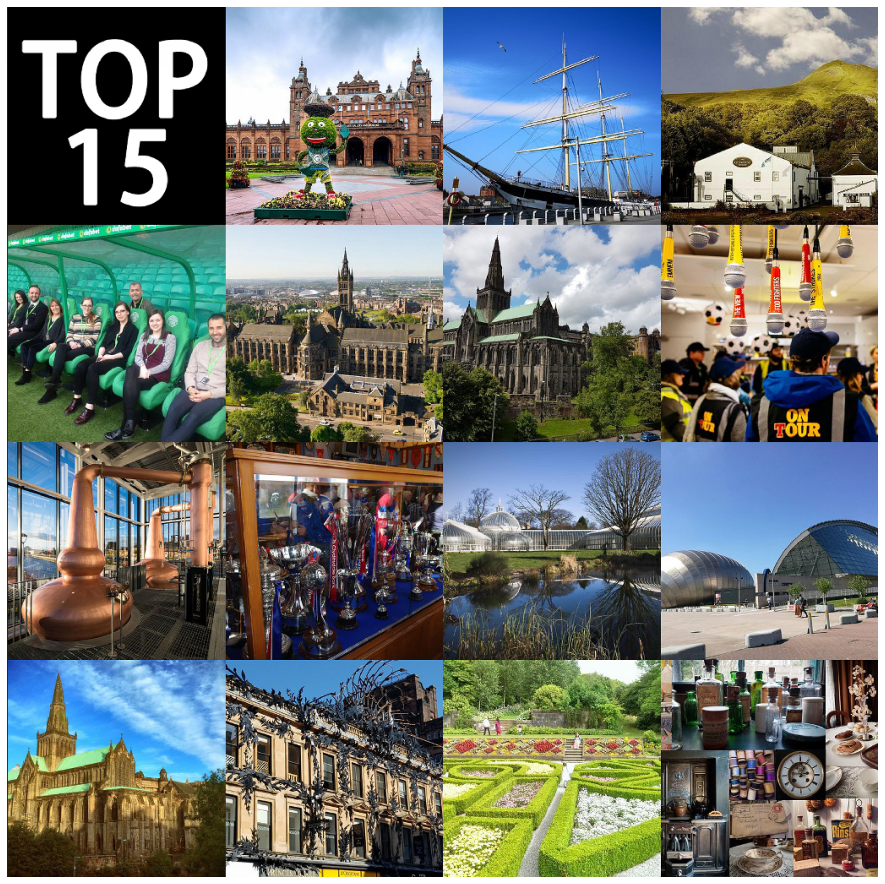

In [11]:
plt.figure(figsize=(16,16))
lena = mpimg.imread('top15.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

### 4.1 Top15 attractions basic information
As can be seen from the table below, many of the top15 attractions have many matching characteristics. In brief, there are four museums, three wineries, two sports fields, two gardens/parks, one university, one cemetery, one religious site and one pedestrian street. It can be seen from the map that top15 attractions are mainly located in west end and city centre areas. Only one atrraction, Glengoyne Distillery, is far from the glasgow city center.

In [12]:
top100_15 = top100[0:15]
top100_15_s = top100_15[['name','detail']]
top100_15_s.head(15)

,name,detail
0,Kelvingrove Art Gallery and Museum,Art Museums
1,The Riverside Museum of Transport and Travel,Speciality Museums
2,Glengoyne Distillery,Distilleries
3,Celtic Park,Arenas & Stadiums
4,University of Glasgow,Educational sites
5,The Necropolis,Cemeteries
6,Tennents Wellpark Brewery,Breweries
7,The Clydeside Distillery,Distilleries
8,Ibrox Stadium,Arenas & Stadiums
9,Glasgow Botanic Gardens,Gardens


In [16]:
gla_map3 = folium.Map(location=[g_latitude,g_longitude],zoom_start = 9,tiles='cartodbpositron')

attractions = plugins.MarkerCluster().add_to(gla_map)

for lat,lng,name in zip(top100_15.lat, top100_15.lon, top100_15.name):
        folium.Marker(
            location=[lat,lng],
            icon = None,
            popup = name,
        ).add_to(attractions)

gla_map3.add_child(attractions)

In [4]:
top15 = pd.read_csv('top15.csv')

In [5]:
top15 = top15.drop('Unnamed: 0',axis=1)

In [6]:
top15.shape

(44033, 9)

In [15]:
top15.head()

,name,date,content,score,main,vote,contribution,travel_type,site
0,Sandra,2020-08-01,Great museum in the west end of Glasgow. Look ...,5,Wonderful,0,4,as a couple,01 Kelvingrove Art Museum
1,Sam F,2020-04-01,We actually visited march 2020. Its a great mu...,4,Fantastic and Free!,11,23,Not Given,01 Kelvingrove Art Museum
2,Deepshikha,2019-12-01,This place is a must visit if you are in Glasg...,5,Insightful and Amazing,20,49,Not Given,01 Kelvingrove Art Museum
3,Lydros,2020-11-01,You should go and visit this gallery when you ...,5,A must place to visit,0,11,solo,01 Kelvingrove Art Museum
4,Sharlatte Rex,2020-10-01,This is a place of living history. This is the...,5,Great Museum.,1,3,Not Given,01 Kelvingrove Art Museum


From Figure 1 and Figure 2, the ranking of each attraction is not based on the total number of comments or the average rating, and TripAdvisor has not given a specific ranking formula. 

The number of comments shown in the figure will be different from the number of comments shown at the top100. Because there are 3%-7% of the comments are written in other languages, which are not included in this analysis. All top15 scores are in the range of 4.5±0.3. The average rating of the Clydeside distillery is the highest, and the average rating of Glasgow science is the lowest. 

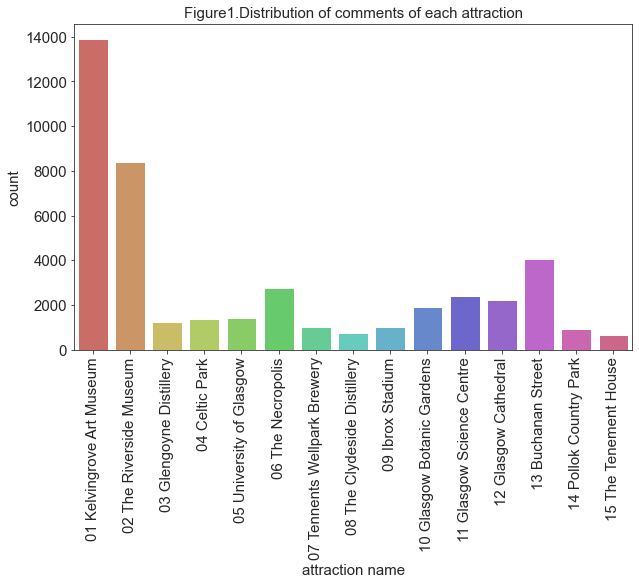

In [36]:
plt.figure(figsize=(10,6))
sns.set_style("ticks")
ax = sns.countplot(x="site", data=top15, palette=sns.color_palette("hls", 15))
ax.set_title('Figure1.Distribution of comments of each attraction', fontsize=15)
ax.set_ylabel('count', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

In [13]:
mscore = top15.groupby('site',as_index=False)['score'].mean()

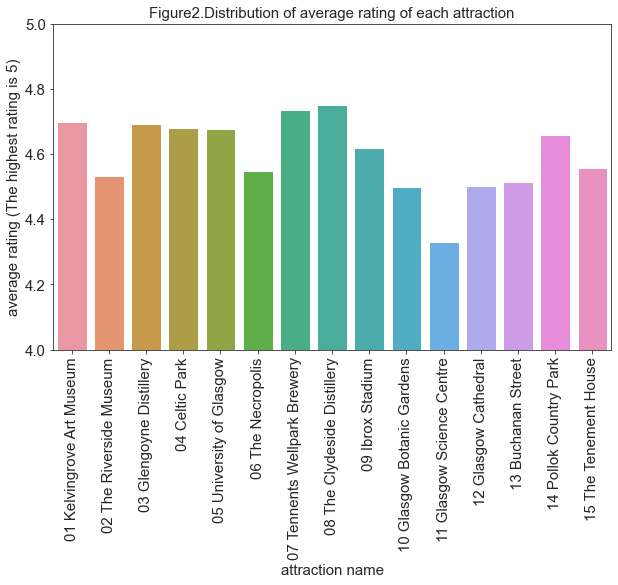

In [37]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x='site',y='score',data=mscore)
plt.ylim(ymin = 4)
plt.ylim(ymax = 5)
ax.set_title('Figure2.Distribution of average rating of each attraction', fontsize=15)
ax.set_ylabel('average rating (The highest rating is 5)', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

### 4.2 contributions and helpful votes
In TripAdvisor, the avatar of each reviewer will show how many comments it has posted in TripAdvisor. This value is displayed as the value of 'contribution'. It also shows how many other viewers' 'helpful votes' these reviewers have received in total. It can show visitors' characteristics, such as whether they are keen to post comments and the degree of recognition of their comments by other TripAdvisor visitors.

People with high contributions and high helpful votes are referred to as 'enthusiasts' in this study. Their comments will have a more significant impact on viewers than other comments in practice. However, overall, because TripAdvisor's comment display mechanism is mainly time series unless special attention is given in the settings, other viewers still lack the motivation to click to turn pages constantly. 

Figures 3, 4, and 5 show that the number of helpful votes and contributions has a significant positive linear relationship. The most popular attraction among 'enthusiasts' are Glasgow Cathedral and the Tenement House. Moreover, some anomalies, the median contribution and vote of Clydeside Distillery, Tennents Wellpark Brewery and Celtic Park are shallow. This point will be analysed in summary.


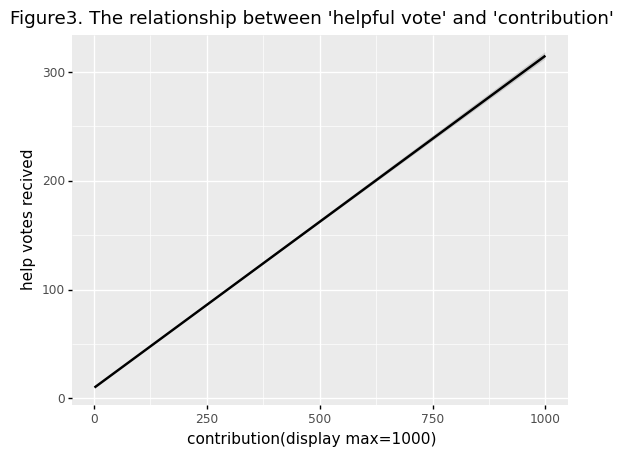

<ggplot: (147834433588)>

In [42]:
ggplot(top15, aes(x='contribution',y='vote')) + geom_smooth() + xlim(1,1000) + theme()+labs(title = "Figure3. The relationship between 'helpful vote' and 'contribution'",x = "contribution(display max=1000)",y = "help votes recived") 

In [15]:
mdvote = top15.groupby('site',as_index=False)['vote'].median()

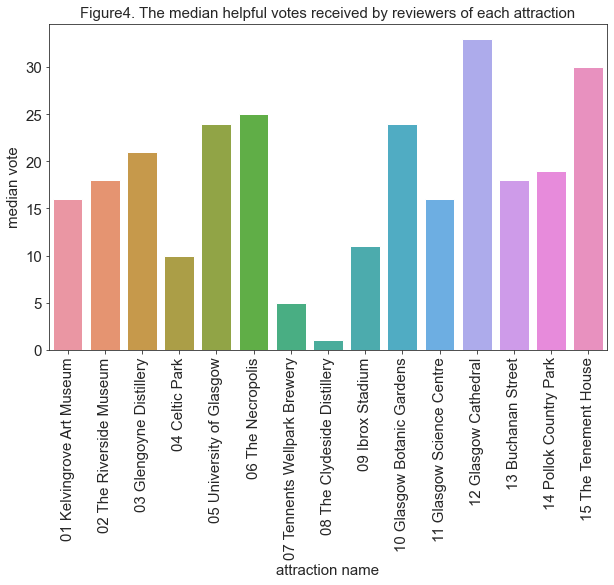

In [43]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x='site',y='vote',data=mdvote)
ax.set_title('Figure4. The median helpful votes received by reviewers of each attraction', fontsize=15)
ax.set_ylabel('median vote', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

In [17]:
mcontri = top15.groupby('site',as_index=False)['contribution'].median()

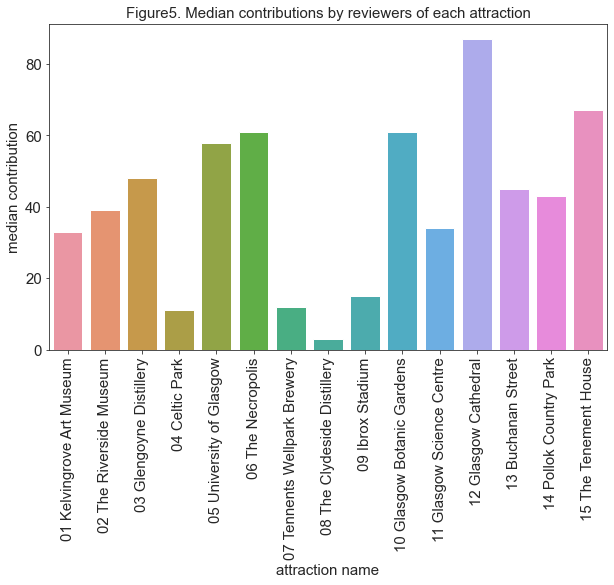

In [44]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x='site',y='contribution',data=mcontri)
ax.set_title('Figure5. Median contributions by reviewers of each attraction', fontsize=15)
ax.set_ylabel('median contribution', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

Figure 6 show the relationship between 'average rating' and 'help vote' of each attraction. Overall, the ratings of 'enthusiasts' are stricter than others. However, the situation of each attraction in the TOP15 is different. Those straight lines with a smaller slope mean that the attraction may be more 'worthy of its name' or meet the expectations of 'enthusiasts'. Furthermore, those straight lines with a greater degree of inclination may mean that the attraction's actual quality may be lower than the expectations of the "enthusiasts". The line with the most apparent decline in the TOP15 represents "Celtic Park". The smoothest line represents The Riverside Museum and The Tenement House.

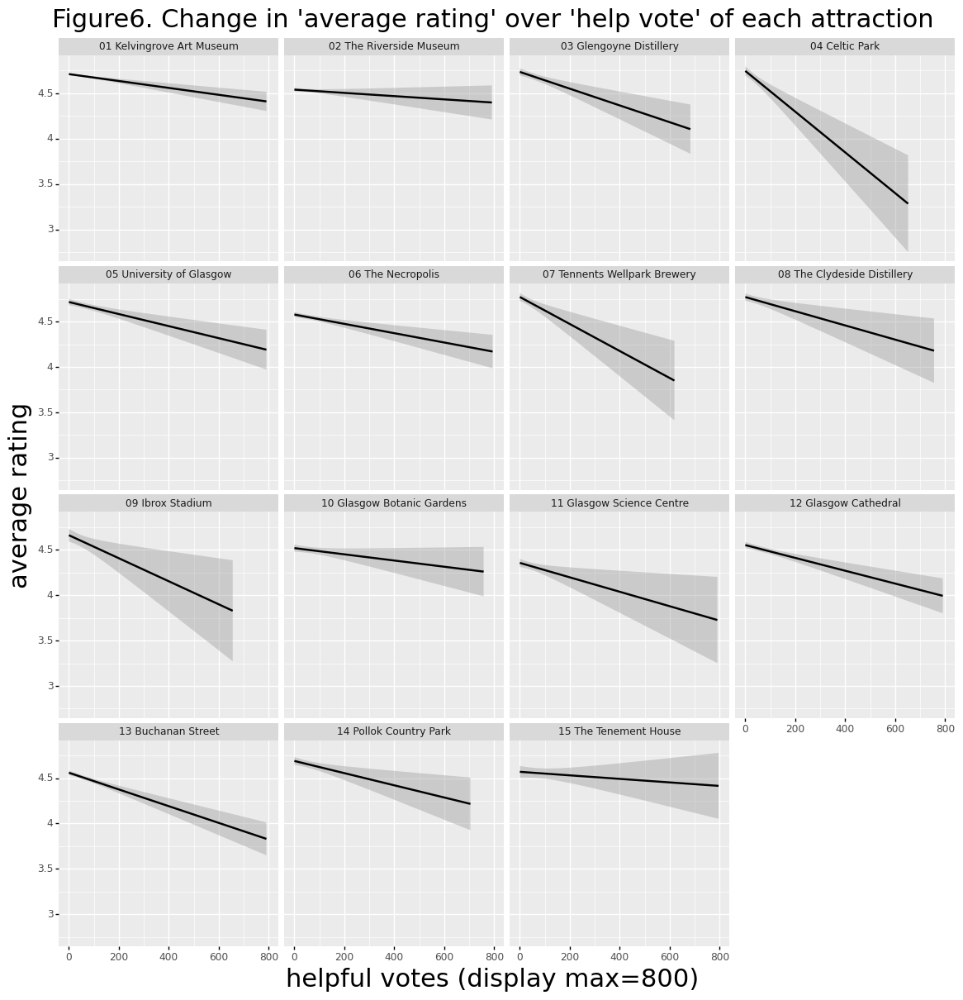

<ggplot: (147831011729)>

In [106]:
ggplot(top15, aes(x='vote',y='score')) + geom_smooth() + xlim(0,800) + facet_wrap('site') + theme(figure_size=(14, 14),title = element_text(size=22))+labs(title = "Figure6. Change in 'average rating' over 'help vote' of each attraction",x = "helpful votes (display max=800)",y = "average rating") 

### 4.3 travel type
At the end of each comment, some reviewers choose to show the type they travel. There are six situations, travelled solo, travelled with family, travelled on business, travelled with friends, travelled as a couple or not given. The statistics of the travel style can represent the main target groups of different attractions. The staff of each attraction can also optimise the attraction according to the characteristics of these people.

From the following six figures, we can see that Buchanan Street and The Necropolis are the most popular with solo visitors. The most popular among families is Glasgow Science Centre, which is close to 50%. It is worth noting that the actual visitors are mainly children, but the actual evaluators are mostly their parents. Therefore, the evaluation of the attraction does not reflect the experience of the children. The most popular among business visitors is the University of Glasgow. However, it is worth noting that this type of travel has the lowest proportion of all travel types. The most popular with friend visitors are Tennents Wellpark brewery and Glengoyne Distillery, both well-known wineries. The most popular with couples is The Tenement House. It is worth noting that the Clydeside Distillery and Ibox Stadium comment information is abnormal. The proportion of Not given of them is close to 70%.


In [10]:
travel = top15.groupby(['site','travel_type'],as_index=False).count()

In [11]:
sitecount = top15.groupby('site')['travel_type'].count()
typecount = top15.groupby(['site','travel_type'])['vote'].count()
percent = 100*typecount/sitecount
percent = pd.DataFrame(percent)
percent = percent.reset_index()
percent.columns = ['site','type','p']

In [12]:
solo = percent[percent['type'] == 'solo']
family = percent[percent['type'] == 'with family']
business = percent[percent['type'] == 'on business']
friends = percent[percent['type'] == 'with friends']
couple = percent[percent['type'] == 'as a couple']
notgiven = percent[percent['type'] == 'Not Given']

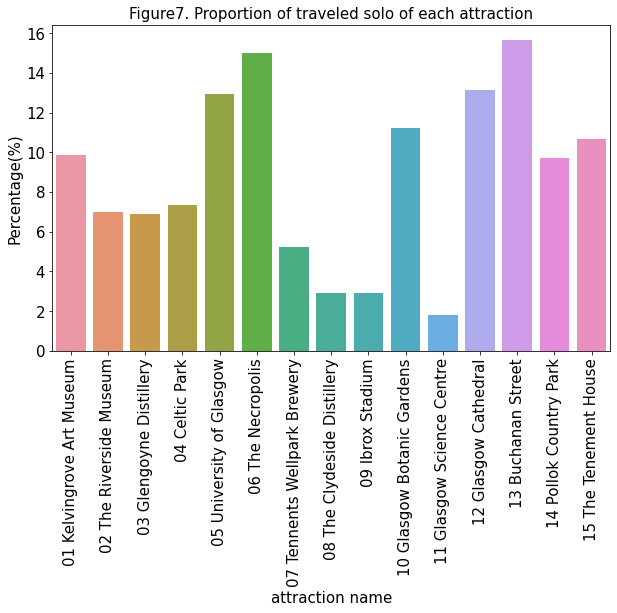

In [13]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x='site',y='p',data=solo)
ax.set_title('Figure7. Proportion of traveled solo of each attraction', fontsize=15)
ax.set_ylabel('Percentage(%)', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

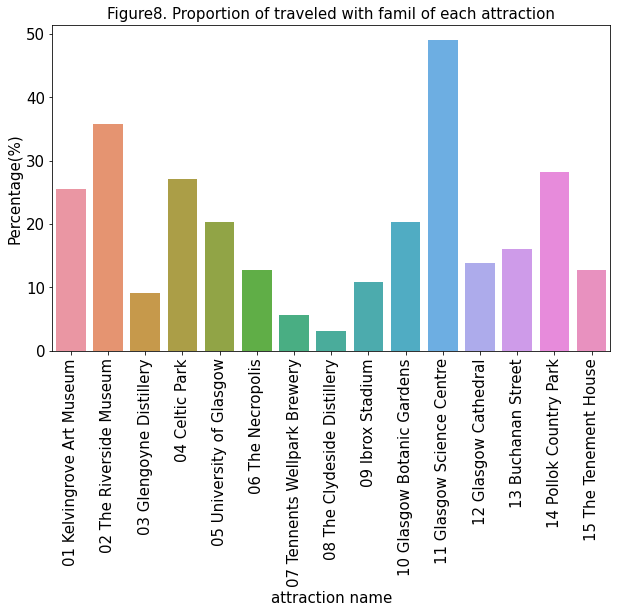

In [14]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x='site',y='p',data=family)
ax.set_title('Figure8. Proportion of traveled with famil of each attraction', fontsize=15)
ax.set_ylabel('Percentage(%)', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

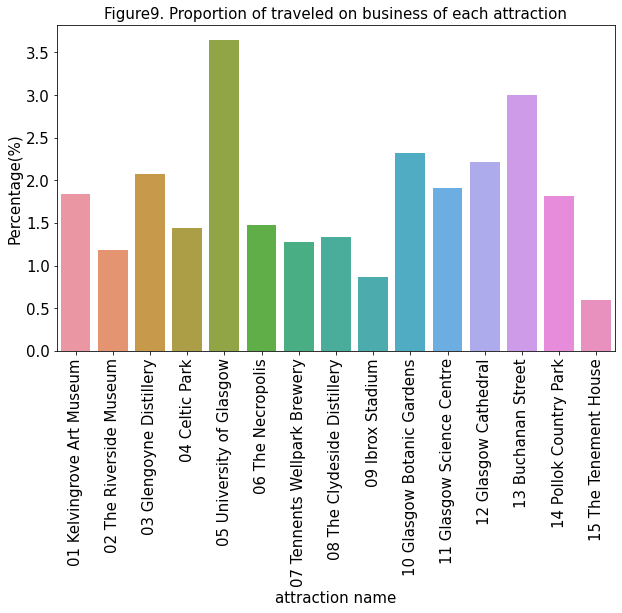

In [15]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x='site',y='p',data=business)
ax.set_title('Figure9. Proportion of traveled on business of each attraction', fontsize=15)
ax.set_ylabel('Percentage(%)', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

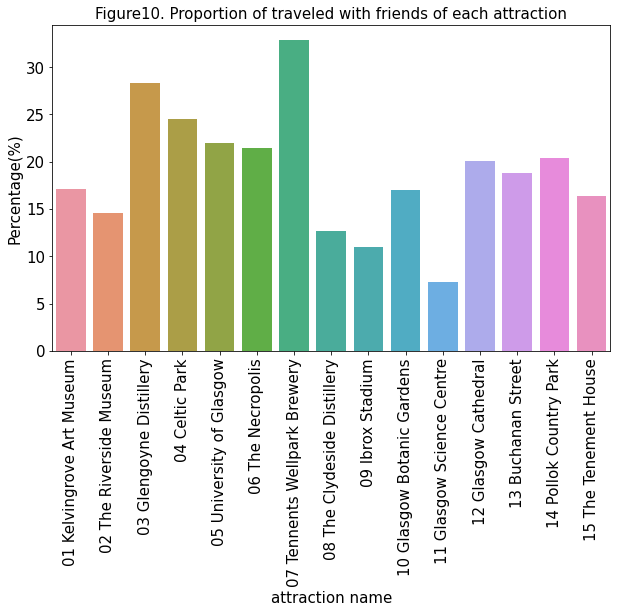

In [16]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x='site',y='p',data=friends)
ax.set_title('Figure10. Proportion of traveled with friends of each attraction', fontsize=15)
ax.set_ylabel('Percentage(%)', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

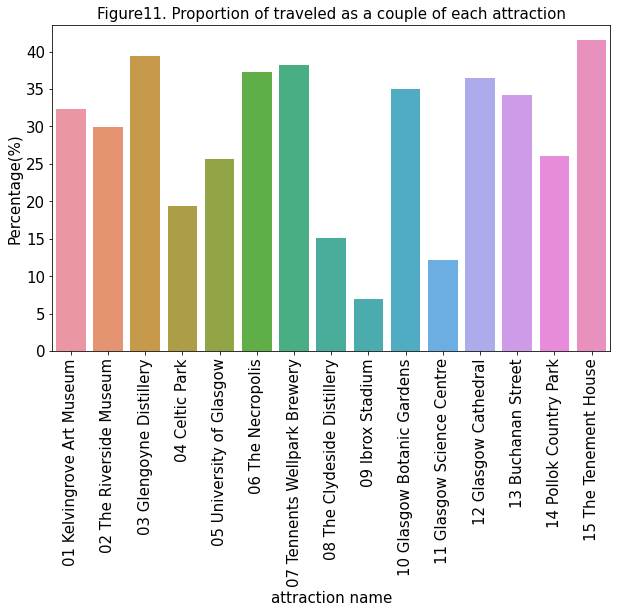

In [17]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x='site',y='p',data=couple)
ax.set_title('Figure11. Proportion of traveled as a couple of each attraction', fontsize=15)
ax.set_ylabel('Percentage(%)', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

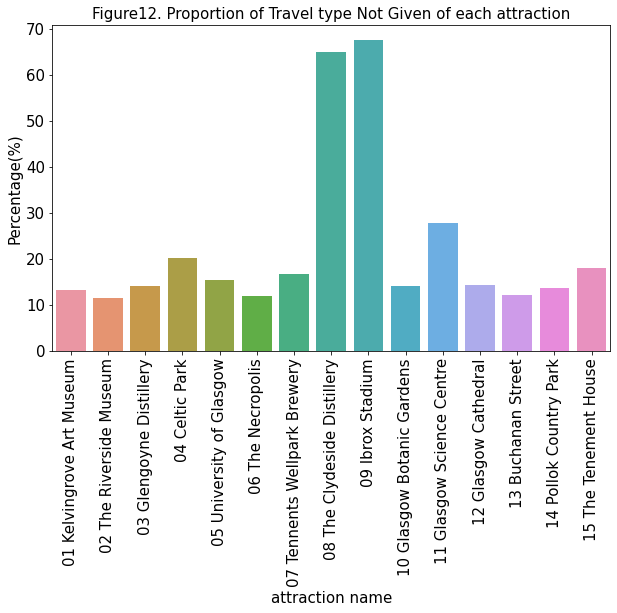

In [18]:
plt.figure(figsize=(10,6))
ax = sns.barplot(x='site',y='p',data=notgiven)
ax.set_title('Figure12. Proportion of Travel type Not Given of each attraction', fontsize=15)
ax.set_ylabel('Percentage(%)', fontsize=15)
ax.set_xlabel('attraction name', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
for item in ax.get_xticklabels():
    item.set_rotation(90)

### 4.4 Time series analysis

### 4.4.1 comment volume change by time
From figure13, the number of comments of TOP15 attractions has grown rapidly from 2010 to 2016, which is related to the surge in users of TripAdvisor and the development of Glasgow's tourism. However, the number of reviews has declined since 2017. This may be related to TripAdvisor's market share, review rules, and the Glasgow tourism itself. The real reasons for the decline need further analysis in the future. The COVID epidemic in 2020 has had a severe impact on Glasgow's tourism, and the number of comments has dropped by 80% compared to previous years.

In [19]:
top15['date'] = pd.to_datetime(top15['date'],infer_datetime_format=True)
top15['Year'] = top15['date'].dt.year
top15['Month'] = top15['date'].dt.month

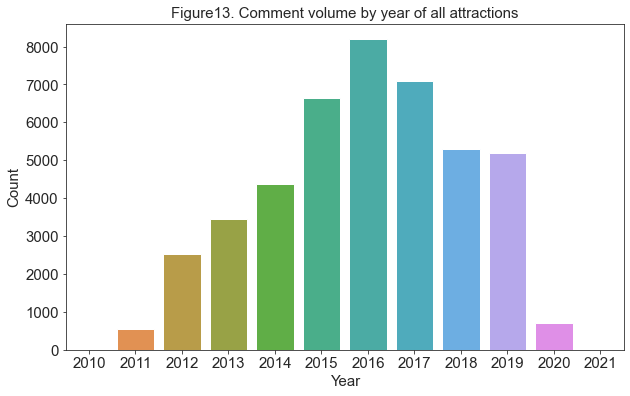

In [65]:
plt.figure(figsize=(10,6))
ax = sns.countplot(x='Year',data=top15)
ax.set_title('Figure13. Comment volume by year of all attractions', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_xlabel('Year', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

From figure14 and figure15, the hot season for tourism in Glasgow is summer and autumn, with the largest number of tourists from July to August each year. These months are also when the weather is at its best.

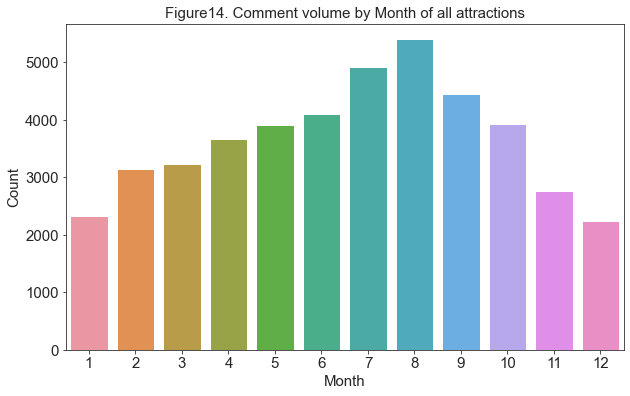

In [66]:
plt.figure(figsize=(10,6))
ax = sns.countplot(x='Month',data=top15)
ax.set_title('Figure14. Comment volume by Month of all attractions', fontsize=15)
ax.set_ylabel('Count', fontsize=15)
ax.set_xlabel('Month', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.show()

In [62]:
heat = top15.groupby(['Year','Month'])['content'].count()
heat = pd.DataFrame(heat)
heat = heat.reset_index()
temp = heat.pivot('Year','Month','content')

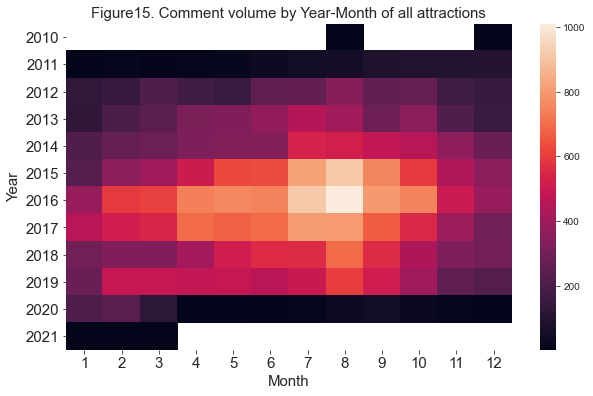

In [67]:
plt.figure(figsize=(10,6))
ax = sns.heatmap(temp)
ax.set_title('Figure15. Comment volume by Year-Month of all attractions', fontsize=15)
ax.set_ylabel('Year', fontsize=15)
ax.set_xlabel('Month', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.yticks(rotation=0)
plt.show()

From figure16 and figure17, unlike the overall situation, the number of comments on Ibrox Stadium and The Tenement House is increasing year by year until 2020. Celtic Park's comments surged in 2019, which was related to the critical football matches it hosted. The Clydeside Distillery only has reviewed since 2017, so it is not easy to make comparisons. Since Celtic Park and Ibrox Stadium hold sports events, the distribution of hot spots is different from other attractions.

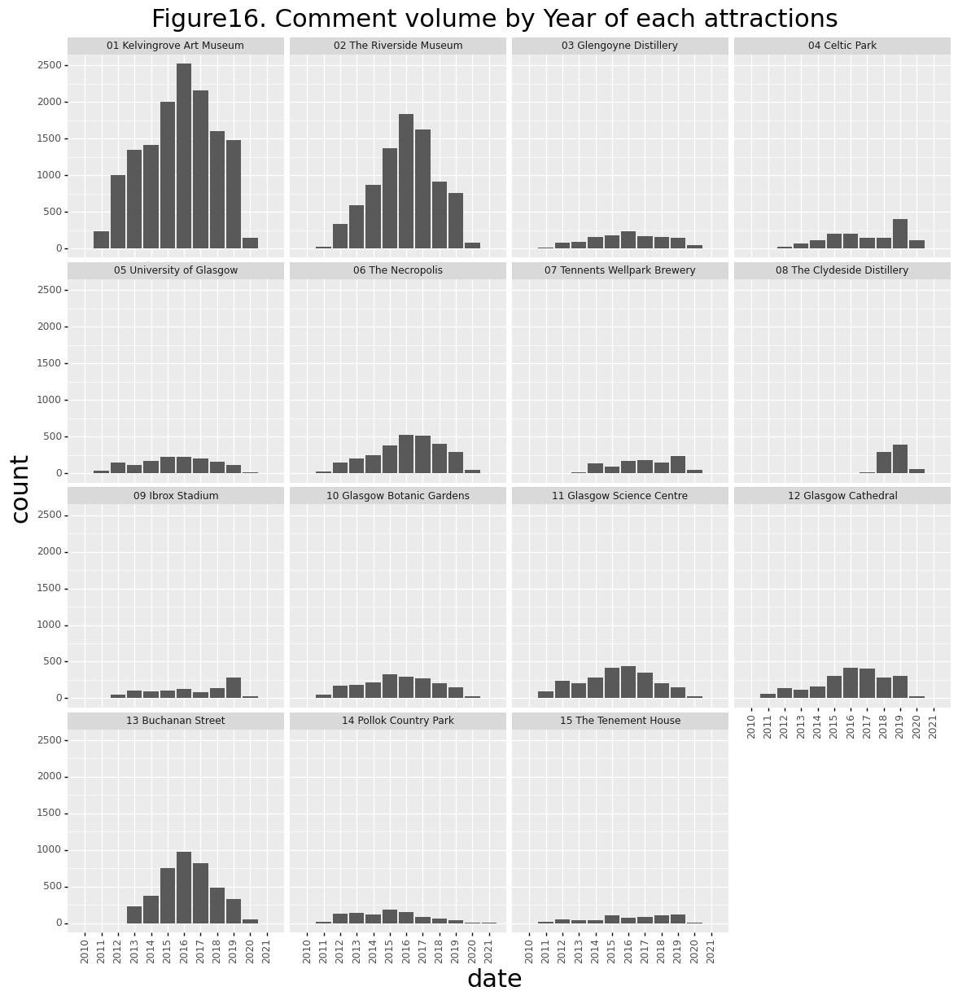

<ggplot: (147878440442)>

In [104]:
ggplot(top15, aes(x='Year')) + geom_bar() + facet_wrap('site') + theme(axis_text_x=element_text(angle=90),figure_size=(14, 14),title = element_text(size=22)) + scale_x_continuous(breaks=range(2010, 2022), minor_breaks=[1]) +labs(title = "Figure16. Comment volume by Year of each attractions",x = "date",y = "count")  

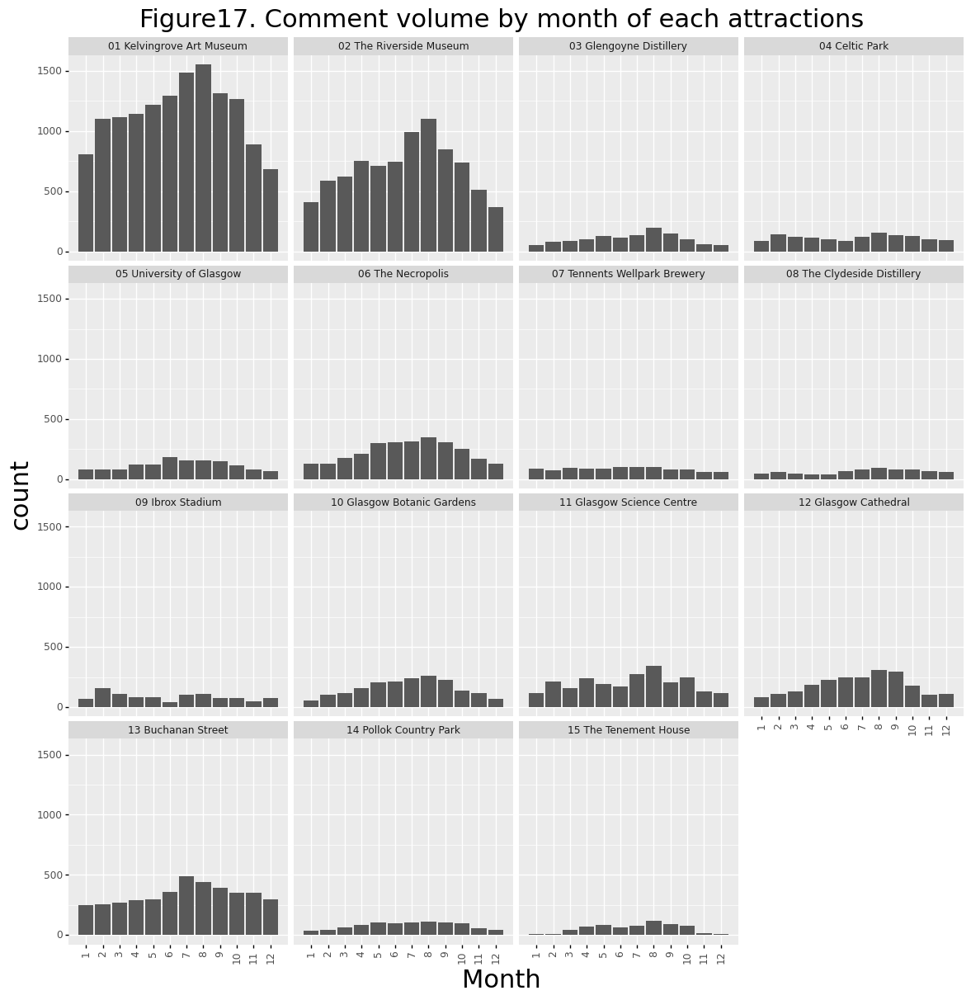

<ggplot: (147818316548)>

In [98]:
ggplot(top15, aes(x='Month')) + geom_bar() + facet_wrap('site') + theme(axis_text_x=element_text(angle=90),figure_size=(14, 14),title = element_text(size=22))+scale_x_continuous(breaks=range(1, 13), minor_breaks=[1])+labs(title = "Figure17. Comment volume by month of each attractions",x = "Month",y = "count")  

### 4.4.2 average rating change by time
The change of the average rating over time can show the change in the degree of popularity of visitors' attractions. The rise and fall of the score are worthy of further in-depth analysis of the specific reasons.

From figure19 and figure20, the average rating of Top15 attractions has gradually increased over time. However, from figure21, the specific situation is different for each attraction. The average rating increased significantly over time is The Riverside Museum, Celtic Park and Ibrox Stadium. The average score decreased significantly over time is Tennents Wellpark Brewery and Buchanan Street.


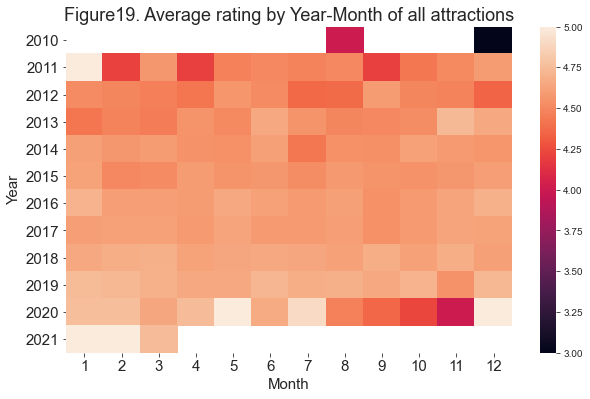

In [75]:
heat1 = top15.groupby(['Year','Month'])['score'].mean()
heat1 = pd.DataFrame(heat1)
heat1 = heat1.reset_index()
temp1 = heat1.pivot('Year','Month','score')

plt.figure(figsize=(10,6))
ax = sns.heatmap(temp1)
ax.set_title('Figure19. Average rating by Year-Month of all attractions', fontsize=18)
ax.set_ylabel('Year', fontsize=15)
ax.set_xlabel('Month', fontsize=15)
plt.xticks(fontsize=15)
plt.yticks(fontsize=15)
plt.yticks(rotation=0)
plt.show()

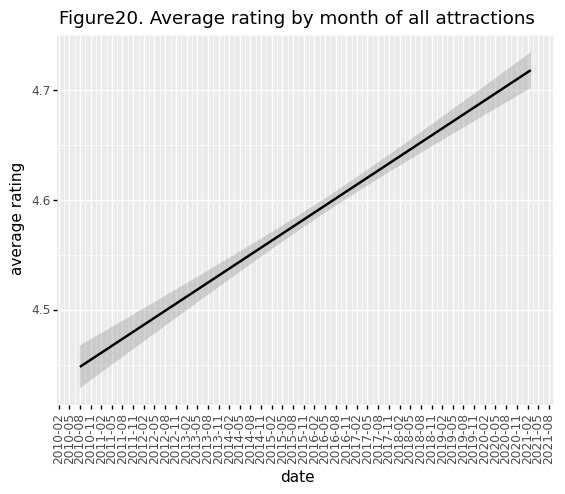

<ggplot: (147871855098)>

In [111]:
ggplot(top15, aes(x='date',y='score')) + scale_x_date(breaks='3 months', date_labels='%Y-%m')+theme(axis_text_x=element_text(angle=90)) + geom_smooth() + labs(title = "Figure20. Average rating by month of all attractions",x = "date",y = "average rating")  

In [112]:
Figure21 = (ggplot(top15, aes(x='date',y='score'))) + geom_smooth() + facet_wrap('site') + theme(axis_text_x=element_text(angle=90),figure_size=(14, 14),title = element_text(size=22))+labs(title = "Figure21. Change of average rating over time of each attraction",x = "date",y = "average rating") + geom_abline(intercept = 37, slope = -5) 

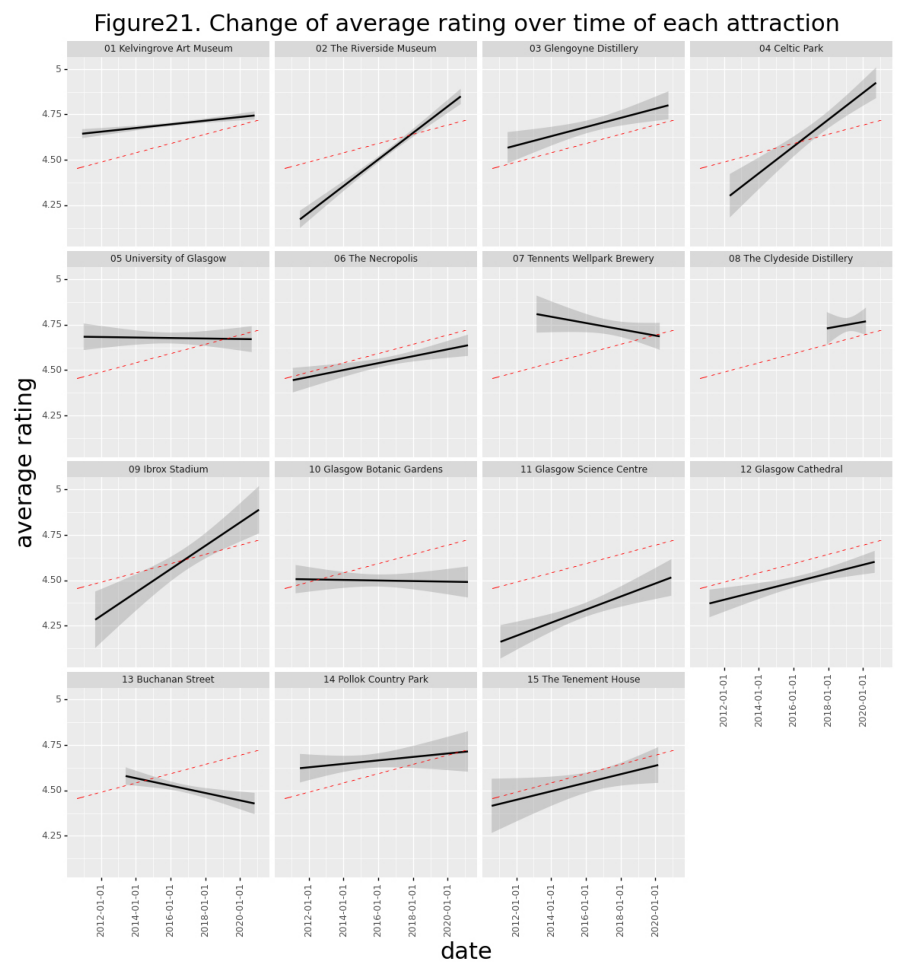

In [113]:
plt.figure(figsize=(16,18))
lena = mpimg.imread('Figure21.jpg') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

## 6. Noise in the ranking
Due to the platform's openness and the need for profitability, there will inevitably be untrue situations in the comments and rankings. Therefore, it is necessary to identify which popular attractions are ranked too high.

Firstly, according to Figure 1, the breweries and stadiums have a low number of comments relative to their ranking. This is due to the fact that TripAdvisor recommends a number of paid themed bus trips, which often include breweries and stadiums, and makes their rank higher.

Second, from the above analyses, we can find that many data of 08 The Clydeside Distillery have specific problems: 

1. Compared to other attractions, the total number of comments is low, and the first comment appeared in 2017.
2. The low median number of contribution and vote represents that the vast majority of commenters are newcomers or newly registered accounts
3. The abnormally high proportion of Not Given of travel type.

Based on these, we can infer that the ranking of 08 The Clydeside Distillery is falsely high, and there may be fake reviews or commercial promotion. However, TripAdvisor officials did not give relevant annotations.



### 4.5 Word cloud analysis

Glasgow Top15 attractions have 44,032 reviews. The visitor's comments contain much helpful information. Doing word cloud analysis on these comments can let us know what the most mentioned words by visitors. These words help to understand the essential characteristic of each attraction in the hearts of visitors. This research uses 'textblob' for word cloud analysis. 

This research first analysed the content and title of all TOP15 reviews and then made a word cloud image for each attraction's content and title. Also, for space considerations, only one analysis process is shown here. The complete code is in **Appendix4 Wordcloud.ipynb** and **Appendix4 Wordcloud.html**.


In [78]:
from textblob import TextBlob
import nltk
from nltk.stem import WordNetLemmatizer
from wordcloud import WordCloud
import PIL.Image as image

In [79]:
comment_arr = top15.to_numpy()

In [80]:
l=len(top15)
comment_arr=[]
subjectivity_arr=[]

In [81]:
text_corpus=""
for t in top15["content"]:
    text_corpus=text_corpus+"."+t

In [83]:
text_nopunct=''
text_nopunct= "".join([char for char in text_corpus if char not in string.punctuation])

In [84]:
tokenizer = nltk.tokenize.RegexpTokenizer('\w+')
text_tokens = tokenizer.tokenize(text_nopunct)

text_words = []
for word in text_tokens:
    text_words.append(word.lower())

In [85]:
stopwords = nltk.corpus.stopwords.words('english')

final_words=[]

for word in text_words:
    if word not in stopwords:
        final_words.append(word)

In [86]:
wn = WordNetLemmatizer()

lem_final_words=[]

for word in final_words:
    word=wn.lemmatize(word)
    lem_final_words.append(word)

In [87]:
freq_dist_text = nltk.FreqDist(lem_final_words)

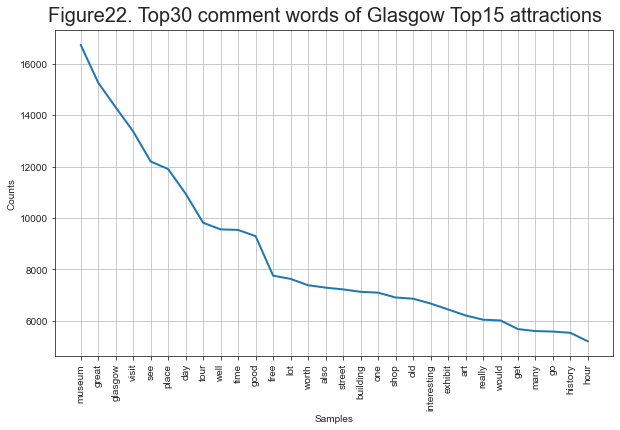

<AxesSubplot:xlabel='Samples', ylabel='Counts'>

In [88]:
plt.figure(figsize=(10,6))
plt.figtext(.5,.9,'Figure22. Top30 comment words of Glasgow Top15 attractions', fontsize=20, ha='center')
freq_dist_text.plot(30)

As can be seen from the figure, among all the TOP15 reviews, the most mentioned word is 'museum'. The number of comments from the Kelvingrove Art Museum and The Riverside Museum accounted for 52% of the total number of comments. 

Among other non-degree words,' street', 'building', 'shop', 'old', and 'history' also have higher frequencies. All these can represent the impressive features of Glasgow attractions. In the analysis of the titles of all TOP15 comments, we can also see such as "family" and "transport". Since high scores account for a large proportion, these words have a positive correlation with emotions.

In [89]:
res_text=' '.join([i for i in lem_final_words if not i.isdigit()])

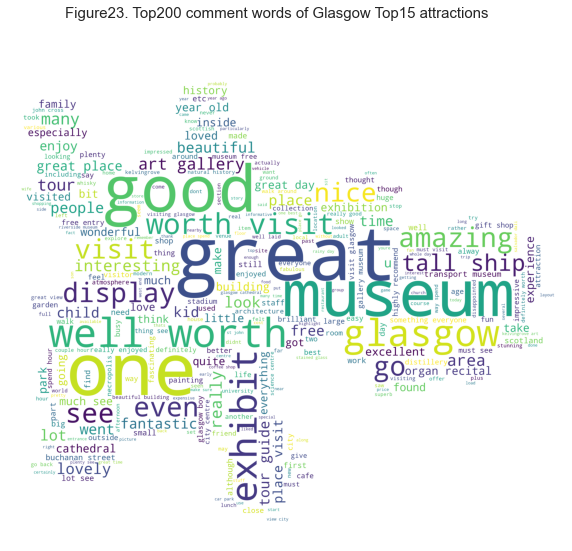

In [96]:
plt.figure(figsize=(10,10))
mask = np.array(image.open('glasgow.jpg'))
wordcloud = WordCloud(    mask = mask,
                          background_color='white',
                          max_words=300,
                          max_font_size=400,
                          width=2000,
                          height=1666
                         ).generate(res_text)


plt.imshow(wordcloud)
plt.figtext(.5,.9,'Figure23. Top200 comment words of Glasgow Top15 attractions', fontsize=15, ha='center')
plt.axis('off')
plt.show()

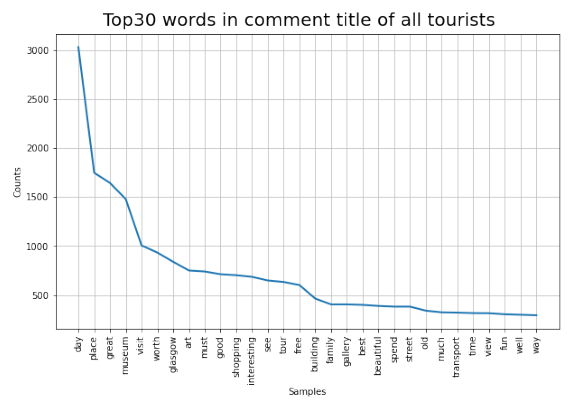

In [134]:
plt.figure(figsize=(10,10))
lena = mpimg.imread('0tt.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

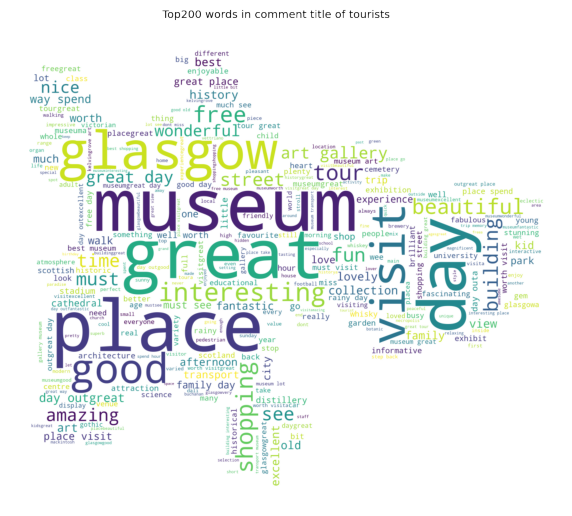

In [186]:
plt.figure(figsize=(10,10))
lena = mpimg.imread('0t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

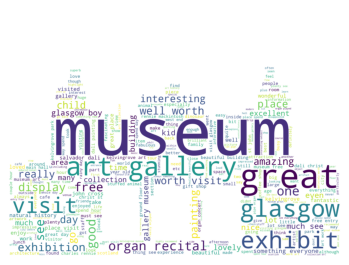

In [163]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('1.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of Kelvingrove Museum （above）

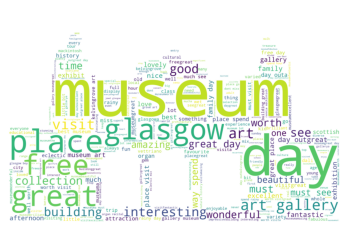

In [162]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('1t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Kelvingrove Museum （above）

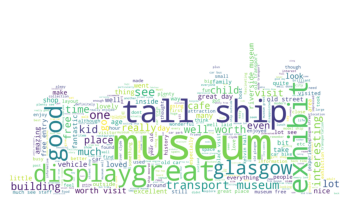

In [161]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('2.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of The Riverside Museum （above）

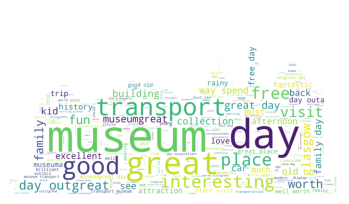

In [160]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('2t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of The Riverside Museum （above）

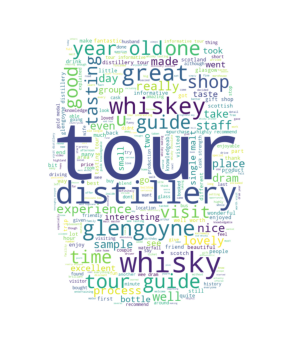

In [159]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('3.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of Glengoyne Distillery （above）

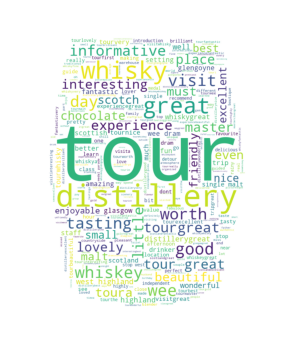

In [158]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('3t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Glengoyne Distillery （above）

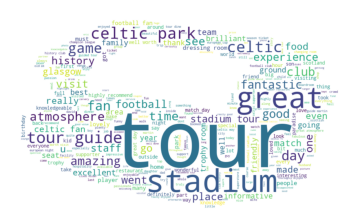

In [157]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('4.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of Celtic Park （above）

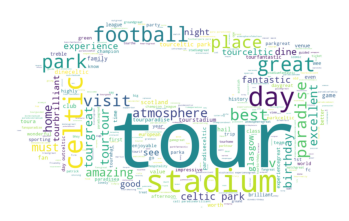

In [156]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('4t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Celtic Park （above）

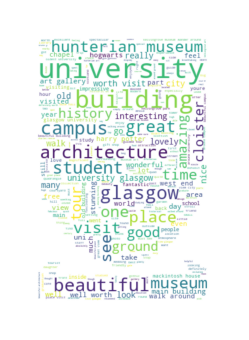

In [155]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('5.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of of University of Glasgow （above）

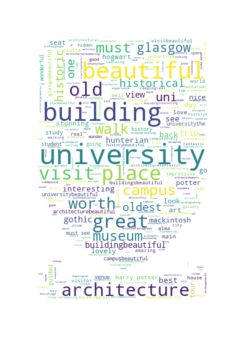

In [154]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('5t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of of University of Glasgow （above）

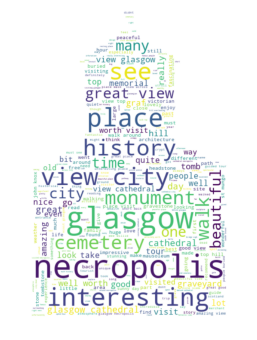

In [153]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('6.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of The Necropolis（above）

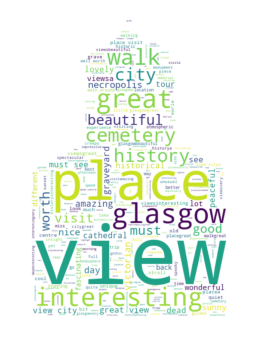

In [152]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('6t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of The Necropolis（above）

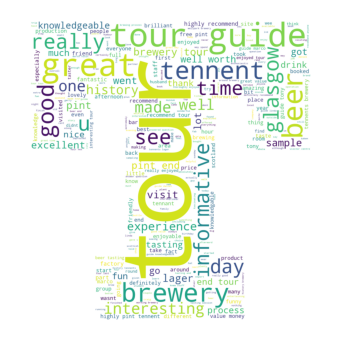

In [150]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('7.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of Tennents Wellpark Brewery（above）

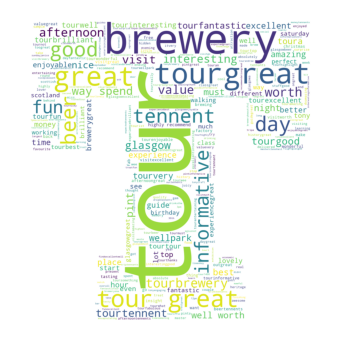

In [151]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('7t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Tennents Wellpark Brewery（above）

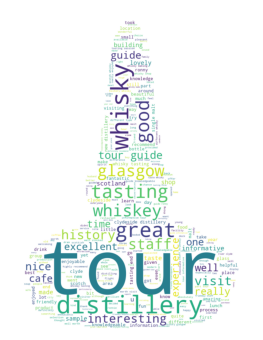

In [164]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('8.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of The Clydeside Distillery（above）

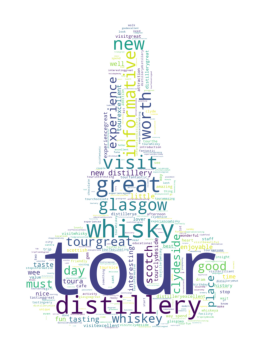

In [165]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('8t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of The Clydeside Distillery（above）

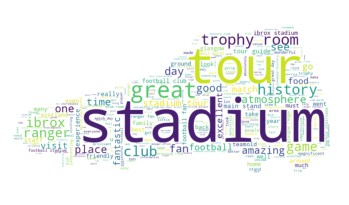

In [166]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('9.png') 
plt.imshow(lena)
plt.axis('off')
plt.show()

Top200 words in comment of Ibrox Stadium（above）

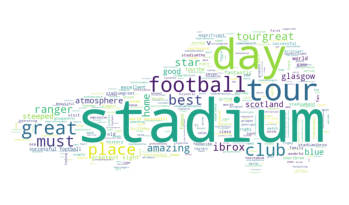

In [167]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('9t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Ibrox Stadium（above）

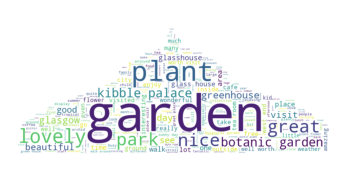

In [168]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('10.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of Glasgow Botanic Gardens（above）

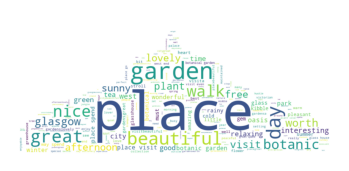

In [169]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('10t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Glasgow Botanic Gardens（above）

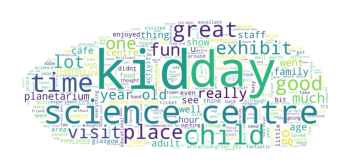

In [170]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('11.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of Glasgow Science Centre（above）

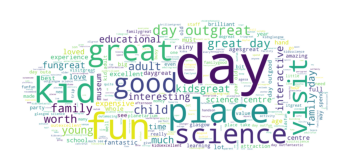

In [175]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('11t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Glasgow Science Centre（above）

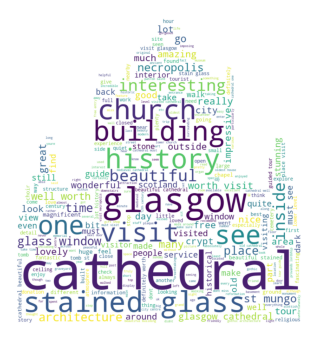

In [176]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('12.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of Glasgow Cathedral（above）

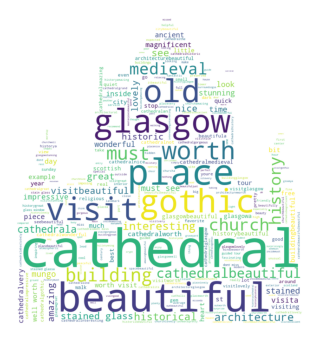

In [178]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('12t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Glasgow Cathedral（above）

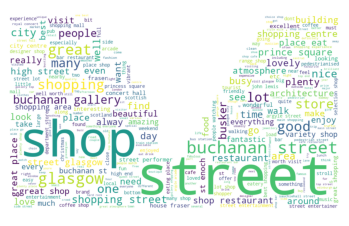

In [179]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('13.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of Buchanan Street（above）

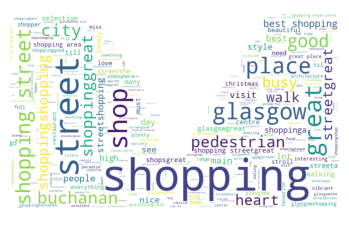

In [180]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('13t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Buchanan Street（above）

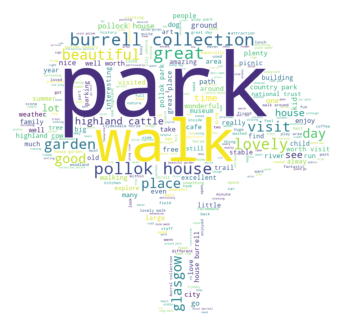

In [181]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('14.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of Pollok Country Park（above）

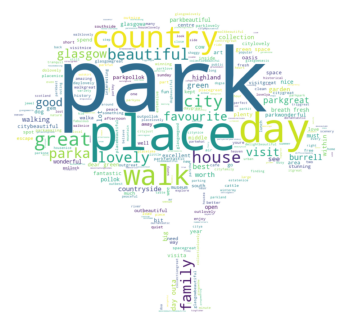

In [182]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('14t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of Pollok Country Park（above）

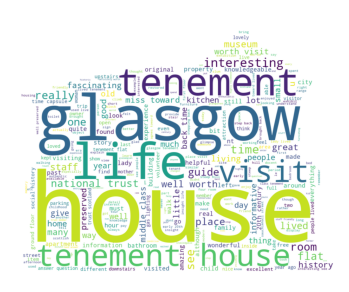

In [183]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('15.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment of The Tenement House（above）

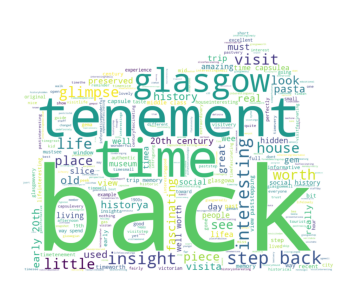

In [184]:
plt.figure(figsize=(6,6))
lena = mpimg.imread('15t.png') 
plt.imshow(lena)
plt.axis('off') 
plt.show()

Top200 words in comment title of The Tenement House（above）

In the word cloud figure of each attraction, there are some words worth paying attention to. For example, the Tenement House review title's most frequent word is 'back', which is scarce in other attractions. After querying the original comment, we can find that the attraction is a museum showing Glasgow housing history. Many visitors feel going back to the past when they visit the museum, so the frequency of back appearing is very high.

## 5. Conclusion

In this research, two valuable data sets were established, which contained basic information of Glasgow's Top 100 attractions on TripAdvisor, and all English-language comments of Top 15 attractions and relevant information about reviewers. These two data sets have great value for follow-up research.

This research conducted various analyses and visualizations on these two data sets.The basic information of Tpo100 attractions is displayed through the map. This research conducted a detailed analysis of the top 15 attractions. Including the relationship between the average rating and whether the reviewer is 'enthusiasts'. The proportion of different travel type in each attraction. The changes in the comment volume and an average rating of each attraction over time. Moreover, found the attraction with inflated rankings. Finally, this research conducted a word cloud analysis of all the TOP15 comments to show visitors' most mentioned words.

There are some limitations of this research. First, on TripAdvisor, there are a small number of non-English comments. Since these comments contain dozens of languages, this analysis did not include them. However, studying these comments can be very effective in understanding the experience of non-English speaking visitors. Glasgow's Tourism and Visitor Plan also aims to increase attractions to these groups of people.

Second, some visitors also uploaded photos they took when commenting. These photos have high analytical value. However, preliminary analysis of photos of some attractions found that the types of photos taken by visitors are greatly affected by its types. For example, museums' photos are mainly exhibits, while the photos of public spaces like parks and streets. It is more abundant. This leads to the difficulty of horizontal comparison. Simultaneously, the current computer graphics are mainly focusing on semantic segmentation, target detection and intelligent description of images. The analysis of the photographer's emotions and specific key objects, for example, the appearance frequency of a specific painting. This also led this research to abandon this part of the analysis at the end. 

Third, when drawing the word cloud for each attraction, the segmentation of the words one by one leads to the semantics' fragmentation. Therefore, many descriptive words appeared in the word cloud figure. If the phrase can be analysed, the researcher can get more helpful information. 

In future research, it is worth trying to build a regression model of keywords/phrases and their related scores. This can further understand which words/phrases have a significant relationship with lower scores, which will also become a necessary basis for increasing attractiveness.


#### Word count: 3092

References:

COUNCIL, G. C. 2017. Glasgow’s Tourism and  Visitor Plan to 2023. https://glasgowtourismandvisitorplan.com/tourism-and-visitor-plan/.

GOVERNMENT, S. 2020. Tourism and events [Online]. Available: https://www.gov.scot/policies/tourism-and-events/ [Accessed 01 April 2021].

GRETZEL, U. & YOO, K. H. 2008. Use and impact of online travel reviews. Information and communication technologies in tourism 2008, 35-46.

TRIPADVISOR. 2019. Online Reviews Remain a Trusted Source of Information When Booking Trips, Reveals New Research [Online]. Tripadvisor. Available: https://tripadvisor.mediaroom.com/2019-07-16-Online-Reviews-Remain-a-Trusted-Source-of-Information-When-Booking-Trips-Reveals-New-Research [Accessed 01 April 2021].
